# Binary CNN

In [1]:
# For Data Processing
import numpy as np
import pandas as pd
import os
import random
from sklearn.utils import shuffle
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
import seaborn as sns


# For ML Models
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras import models
from keras import layers
import sklearn.metrics as metrics
from tensorflow.keras import regularizers
from sklearn.metrics import recall_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import random
import shap
from sklearn.utils import resample
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, roc_curve, auc, average_precision_score
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, Add, GlobalAveragePooling2D, Dense, LeakyReLU
from tensorflow.keras.models import Model

2023-12-08 14:30:34.032284: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-08 14:30:34.226475: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-08 14:30:34.226500: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-08 14:30:34.227444: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-08 14:30:34.308384: I tensorflow/core/platform/cpu_feature_g

In [2]:
os.getcwd()

'/home/jpjon/Desktop/aquawatch/final_model'

In [3]:
os.chdir('Filtered_Data2/Filtered_Data2')

In [4]:
#Paths to data directories
no_advisory_dir = './no_advisory'
#warning_dir = './Warning'
caution_dir = './caution'
danger_dir = './danger'

#Pull in training data
no_advisory_data = []
no_advisory_labels = []

warning_data = []
warning_labels = []

caution_data = []
caution_labels = []

danger_data = []
danger_labels = []

#getting the paths and labels of our no_advisory data

for image in os.listdir(no_advisory_dir):
    no_advisory_data.append(no_advisory_dir+'/'+image)
    no_advisory_labels.append('no_advisory')

# #getting the paths and labels of our warning data
# for image in os.listdir(warning_dir):
#     warning_data.append(warning_dir+'/'+image)
#     warning_labels.append('warning')
        
#getting the paths and labels of our caution data
for image in os.listdir(caution_dir):
    caution_data.append(caution_dir+'/'+image)
    caution_labels.append('caution')

#getting the paths and labels of our danger data
for image in os.listdir(danger_dir):
    danger_data.append(danger_dir+'/'+image)
    danger_labels.append('danger')

no_advisory_data, no_advisory_labels = shuffle(no_advisory_data, no_advisory_labels)
warning_data, warning_labels = shuffle(warning_data, warning_labels)
caution_data, caution_labels = shuffle(caution_data, caution_labels)
danger_data, danger_labels = shuffle(danger_data, danger_labels)

In [5]:
df_no_advisory = pd.DataFrame({'image_path': no_advisory_data, 'label':no_advisory_labels})
#df_warning = pd.DataFrame({'image_path': warning_data, 'label':warning_labels})
df_caution = pd.DataFrame({'image_path': caution_data, 'label':caution_labels})
df_danger = pd.DataFrame({'image_path': danger_data, 'label':danger_labels})

## Distribution of Images

See below for the distribution of images across all microsystin levels.

In [6]:
# append cayuga and clear_lake df
df = pd.concat([df_no_advisory, df_caution, df_danger], ignore_index = True)
df

,image_path,label
0,./no_advisory/BloomImg1-20220811-094846.jpg,no_advisory
1,./no_advisory/BloomImg1-20230626-161509.jpg,no_advisory
2,./no_advisory/BloomImg1-20230605-165450.jpg,no_advisory
3,./no_advisory/BloomImg1-20231005-074107.jpg,no_advisory
4,./no_advisory/BloomImg1-20230605-165744.jpg,no_advisory
...,...,...
515,./danger/156_image6-20200729-173935.jpg,danger
516,./danger/5AJ9UNGonW-Sz0Co3iL1yUGt3FIgu4phfOdns...,danger
517,./danger/5A0AE8~1.PNG,danger
518,./danger/5AE99D~1.PNG,danger


In [7]:
df['label'].value_counts()

label
no_advisory    211
danger         160
caution        149
Name: count, dtype: int64

In [8]:
# Stratify by microsystin levels
train_df = df.copy()

In [9]:
# Define a dictionary with the mappings
label_mapping = {
    'no_advisory': 0,
    'caution': 1,
    'danger': 1
}

# Create the 'encoded_labels' column
train_df['encoded_labels'] = train_df['label'].map(label_mapping)
#test_df['encoded_labels'] = test_df['label'].map(label_mapping)

In [10]:
train_df['encoded_labels'].value_counts()

encoded_labels
1    309
0    211
Name: count, dtype: int64

In [11]:
from sklearn.utils import resample

# Separate the majority and minority classes
majority_class = train_df[train_df['encoded_labels'] == 1]
minority_class = train_df[train_df['encoded_labels'] == 0]

# Upsample the minority class
minority_upsampled = resample(minority_class,
                              replace=True,  # Sample with replacement
                              n_samples=len(majority_class),  # Match the number in the majority class
                              random_state=42)  # Set a random seed for reproducibility

# Concatenate the majority class and upsampled minority class
upsampled_train_df = pd.concat([majority_class, minority_upsampled])

# Shuffle the DataFrame to mix the classes
upsampled_train_df = upsampled_train_df.sample(frac=1, random_state=42).reset_index(drop=True)

In [12]:
upsampled_train_df['encoded_labels'].value_counts()

encoded_labels
1    309
0    309
Name: count, dtype: int64

## Visualize the Images

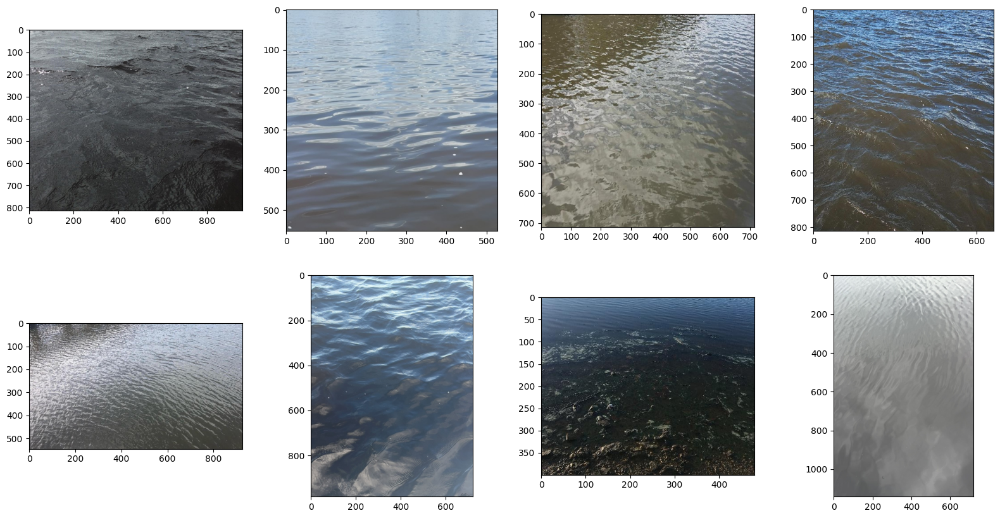

In [13]:
#check first few images of no_advisory
images = []
for idx, img in enumerate(df_no_advisory.image_path):
    img = load_img(
    img)
    images.append(img)
    
nrows, ncols = 2,4 #print first 8 images
f, axs = plt.subplots(nrows, ncols, figsize=(20,10))
indx = 0
for i in range(nrows):
    for j in range(ncols):
        axs[i,j].imshow(images[indx])
        indx += 1

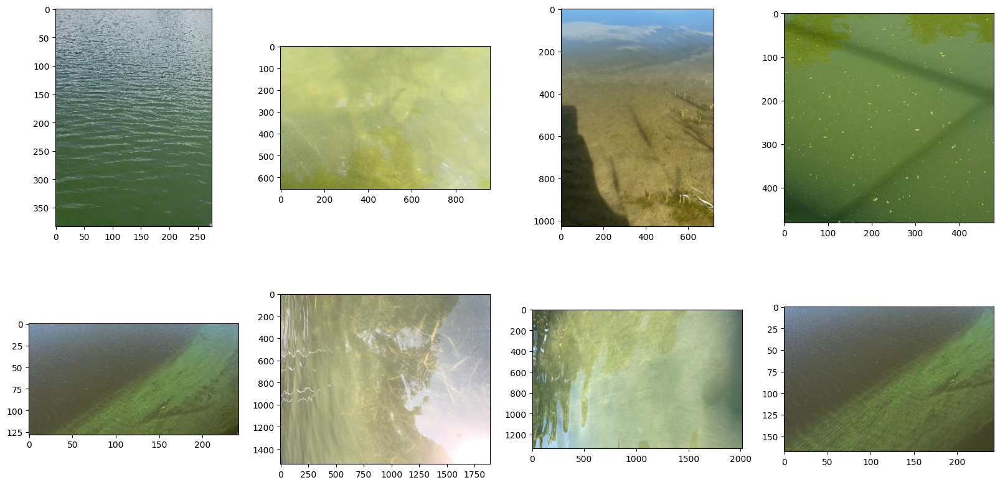

In [14]:
#check first few images of caution
images = []
for idx, img in enumerate(df_caution.image_path):
    img = load_img(
    img)
    images.append(img)
    
nrows, ncols = 2,4 #print first 8 images
f, axs = plt.subplots(nrows, ncols, figsize=(20,10))
indx = 0
for i in range(nrows):
    for j in range(ncols):
        axs[i,j].imshow(images[indx])
        indx += 1

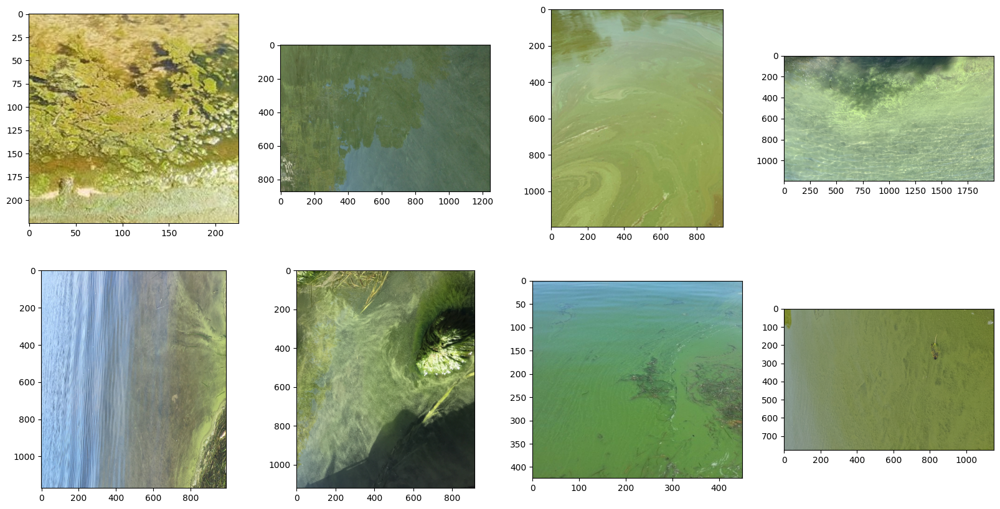

In [15]:
#check first few images of danger
images = []
for idx, img in enumerate(df_danger.image_path):
    img = load_img(
    img)
    images.append(img)
    
nrows, ncols = 2,4 #print first 8 images
f, axs = plt.subplots(nrows, ncols, figsize=(20,10))
indx = 0
for i in range(nrows):
    for j in range(ncols):
        axs[i,j].imshow(images[indx])
        indx += 1

## Size of the Images 

In [16]:
#Changing test set to match format of training data. This is independent to the following preprocessing functions because augmentations are not required
def preprocess1(data):
    images_mini = []
    
    #basically two arrays with images and labels
    for img in (data.image_path):
        img = load_img(img, target_size = (224,224))
        
        img = img_to_array(img)
        
        images_mini.append(img)
    #turns the array into a numpy array with each element in a seperate dimension
    images_mini = np.stack(images_mini)
    y_mini = np.array(data.encoded_labels).flatten()
    return images_mini, y_mini

In [17]:
#X_test, y_test = preprocess1(test_df)
images_mini, y_mini = preprocess1(upsampled_train_df)
print(f"images_mini shape {images_mini.shape}")
print(f"y_mini shape {y_mini.shape}")

images_mini shape (618, 224, 224, 3)
y_mini shape (618,)


2023-12-08 14:30:46.944445: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-12-08 14:30:46.961417: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-12-08 14:30:46.961760: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-12-08 14:30:46.964049: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-12-08 14:30:46.964485: I tensorflow/compile

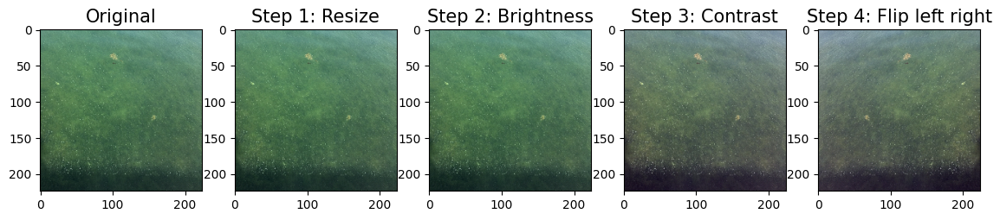

In [18]:
tf.random.set_seed(1234)

fig = plt.figure(figsize=(14, 12))

# pull first image from data
image = images_mini[0]

# plot original
ax = fig.add_subplot(1, 5, 1)
ax.imshow(array_to_img(image))
ax.set_title('Original', size=15);

# resize
ax = fig.add_subplot(1, 5, 2)
img_resize = tf.image.resize(image, size=(224, 224))
ax.imshow(array_to_img(img_resize))
ax.set_title('Step 1: Resize', size=15);


# adjust brightness
ax = fig.add_subplot(1, 5, 3)
img_bright = tf.image.adjust_brightness(img_resize, 0.3)
ax.imshow(array_to_img(img_bright))
ax.set_title('Step 2: Brightness', size=15);


# adjust contrast
ax = fig.add_subplot(1, 5, 4)
img_contrast = tf.image.adjust_contrast(img_bright, contrast_factor=3)
ax.imshow(array_to_img(img_contrast))
ax.set_title('Step 3: Contrast', size=15);


# flip left right
ax = fig.add_subplot(1, 5, 5)
img_flip = tf.image.flip_left_right(img_contrast)
ax.imshow(array_to_img(img_flip))
ax.set_title('Step 4: Flip left right', size=15);

# Data Preprocessing

## Data Augmentation

In [19]:
contrast = 3
DELTA = 0.3

def preprocess2(images_mini, y_mini, split= (0.7, 0.2, 0.1)):
    tf.random.set_seed(1234)
    np.random.seed(1234)
    shuffle = np.random.permutation(np.arange(images_mini.shape[0]))
    images_mini, y_mini = images_mini[shuffle], y_mini[shuffle]
    
    # Calculate split indices
    n_total = len(images_mini)
    n_train = int(n_total * split[0])
    n_val = int(n_total * split[1])
    
    # Splits for validation
    X_train, X_temp = np.split(images_mini, [n_train])
    y_train, y_temp = np.split(y_mini, [n_train])
    X_val, X_test = np.split(X_temp, [n_val])
    y_val, y_test = np.split(y_temp, [n_val])
    
    #greyscaling
    X_train = X_train/255.0
    X_val = X_val/255.0
    X_test = X_test/255.0
    
    #image augmentation
    X_train_augm = tf.image.adjust_brightness(X_train, delta = DELTA)
    X_train_augm = tf.image.adjust_contrast(X_train_augm, contrast_factor = contrast)
    
    #flip
    X_train_augm = tf.image.random_flip_left_right(X_train_augm)
    
    #concatenate original and augmented
    X_train = tf.concat([X_train, X_train_augm], axis = 0)
    
    #concatenate y_train
    y_train_augm = y_train
    y_train = tf.concat([y_train, y_train_augm], axis = 0)
    
    #Shuffle
    shuffle = tf.random.shuffle(tf.range(tf.shape(X_train)[0], dtype = tf.int32))
    X_train = tf.gather(X_train, shuffle)
    y_train = tf.gather(y_train, shuffle).numpy()
    
    return X_train, y_train, X_val, y_val, X_test, y_test

In [20]:
X_train, y_train, X_val, y_val, X_test, y_test = preprocess2(images_mini, y_mini, split= (0.7, 0.2, 0.1))

2023-12-08 14:30:48.251774: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2023-12-08 14:30:48.252694: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:231] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.6
2023-12-08 14:30:48.252714: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:234] Used ptxas at ptxas
2023-12-08 14:30:48.252746: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.


In [21]:
#We have 5104 observations, each having 200x200 pixels, with each pixel having 3 values (which are all the same because they've been greyscaled)
print(f"X_train shape {X_train.shape}")
print(f"y_train shape {y_train.shape}")
print(f"X_val shape {X_val.shape}")
print(f"y_val shape {y_val.shape}")
print(f"X_test shape {X_test.shape}")
print(f"y_test shape {y_test.shape}")

X_train shape (864, 224, 224, 3)
y_train shape (864,)
X_val shape (123, 224, 224, 3)
y_val shape (123,)
X_test shape (63, 224, 224, 3)
y_test shape (63,)


Print training data examples:


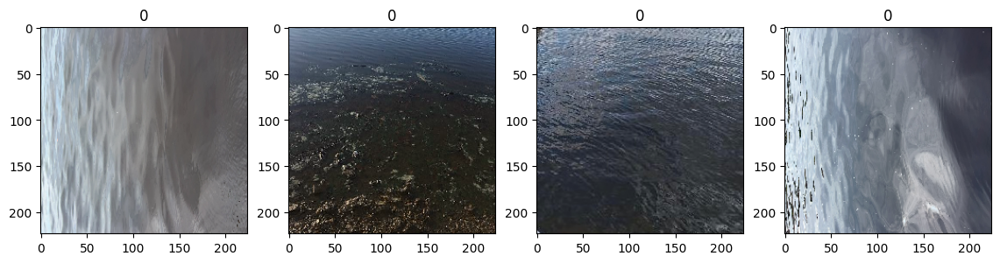

In [22]:
# print taining data
print('Print training data examples:')
nrows, ncols = 1,4 #print first 4 images
f, axs = plt.subplots(nrows, ncols, figsize=(14,12))
for i in range(ncols):
    axs[i].imshow(array_to_img(X_train[i]))
    axs[i].set(title=y_train[i])

Print validation data examples:


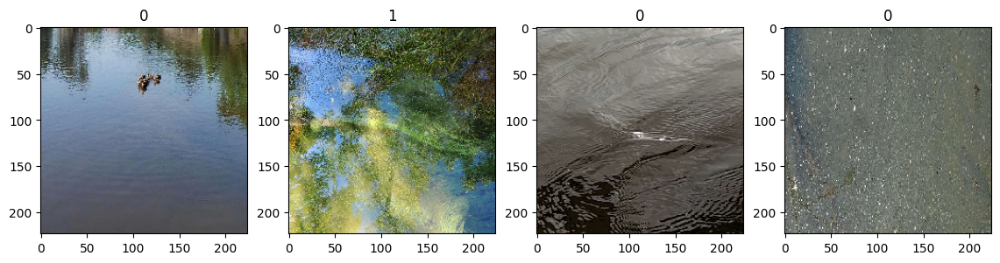

In [23]:
print('Print validation data examples:')
nrows, ncols = 1,4 #print first 4 images
f, axs = plt.subplots(nrows, ncols, figsize=(14,12))
for i in range(ncols):
    axs[i].imshow(array_to_img(X_val[i]))
    axs[i].set(title=y_val[i])

# Binary Case

In [24]:
X_train.shape, y_train.shape

(TensorShape([864, 224, 224, 3]), (864,))

In [25]:
X_train

<tf.Tensor: shape=(864, 224, 224, 3), dtype=float32, numpy=
array([[[[ 1.6067756 ,  1.796207  ,  1.938275  ],
         [ 1.7714819 ,  1.9844422 ,  2.067687  ],
         [ 1.6655993 ,  1.8550307 ,  1.9970987 ],
         ...,
         [ 0.30089355,  0.24326587,  0.27945173],
         [ 0.26559925,  0.20797157,  0.24415743],
         [ 0.27736413,  0.21973646,  0.25592232]],

        [[ 1.6891288 ,  1.8785597 ,  2.020628  ],
         [ 1.7950109 ,  2.0079718 ,  2.0912163 ],
         [ 1.6773642 ,  1.8667952 ,  2.0088634 ],
         ...,
         [ 0.27736413,  0.21973646,  0.25592232],
         [ 0.26559925,  0.20797157,  0.24415743],
         [ 0.25383472,  0.23150098,  0.25592232]],

        [[ 1.7008933 ,  1.8903246 ,  2.0323925 ],
         [ 1.8067758 ,  2.0197363 ,  2.102981  ],
         [ 1.6655993 ,  1.8550307 ,  1.9735693 ],
         ...,
         [ 0.26559925,  0.20797157,  0.24415743],
         [ 0.27736413,  0.21973646,  0.25592232],
         [ 0.24206984,  0.21973646,  0.24415

In [26]:
import tensorflow as tf
from tensorflow.keras.callbacks import Callback
from sklearn.metrics import f1_score
import numpy as np

class F1ScoreCallback(Callback):
    def __init__(self, train_data, val_data):
        super(F1ScoreCallback, self).__init__()
        self.train_data = train_data
        self.val_data = val_data
        self.train_f1_scores = []
        self.val_f1_scores = []

    def on_epoch_end(self, epoch, logs=None):
        train_predictions = np.round(self.model.predict(self.train_data[0]))
        train_f1 = f1_score(self.train_data[1], train_predictions)
        self.train_f1_scores.append(train_f1)

        val_predictions = np.round(self.model.predict(self.val_data[0]))
        val_f1 = f1_score(self.val_data[1], val_predictions)
        self.val_f1_scores.append(val_f1)

        print(f" - train_f1: {train_f1:.4f} - val_f1: {val_f1:.4f}")


In [27]:
def residual_block(x, filters, kernel_size=3, stride=1):
    y = Conv2D(filters, kernel_size=kernel_size, strides=stride, padding='same')(x)
    y = BatchNormalization()(y)
    y = LeakyReLU(alpha=0.01)(y)
    y = Conv2D(filters, kernel_size=kernel_size, padding='same')(y)
    y = BatchNormalization()(y)
    y = LeakyReLU(alpha=0.01)(y)
    if stride > 1:
        x = Conv2D(filters, kernel_size=1, strides=stride, padding='same')(x)
    out = Add()([x, y]) 
    out = LeakyReLU(alpha=0.01)(out)
    return out

def build_resnet(input_shape, num_blocks, num_classes=1):
    input_tensor = Input(shape=input_shape)
    
    x = Conv2D(64, kernel_size=7, strides=2, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.01)(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)
    
    for _ in range(num_blocks):
        x = residual_block(x, filters=64)
    
    x = GlobalAveragePooling2D()(x)
    output_tensor = Dense(num_classes, activation='sigmoid')(x)
    
    model = Model(inputs=input_tensor, outputs=output_tensor)
    
    return model

# Create the ResNet model
input_shape = (224, 224, 3)
num_blocks = 16
model = build_resnet(input_shape, num_blocks)

# Compile the model with metrics
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy',
                       tf.keras.metrics.Precision(),
                       tf.keras.metrics.Recall(),
                       tf.keras.metrics.AUC(name='auc')])

# Create the F1 Score callback
f1_callback = F1ScoreCallback(train_data=(X_train, y_train), val_data=(X_val, y_val))

# Train the model for more epochs
history = model.fit(X_train, y_train, epochs=32, validation_data=(X_val, y_val), callbacks=[f1_callback])

Epoch 1/32


2023-12-08 14:18:52.932691: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2023-12-08 14:18:52.933710: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.
2023-12-08 14:18:53.013290: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8906
2023-12-08 14:18:53.158927: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2023-12-08 14:18:53.159851: W tensorflow/compiler/xla/stream_executor/gpu/redzone_allocator.cc:322] UNIMPLEMENTED: ptxas ptxas too old

 2/27 [=>............................] - ETA: 2s - loss: 2.6984 - accuracy: 0.4531 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.7118  

2023-12-08 14:18:58.997800: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.



27/27 [==============================] - ETA: 0s - loss: 0.7810 - accuracy: 0.7836 - precision: 0.9113 - recall: 0.6238 - auc: 0.8898

2023-12-08 14:19:02.631938: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.1.243, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2023-12-08 14:19:02.632835: W tensorflow/compiler/mlir/tools/kernel_gen/transforms/gpu_kernel_to_blob_pass.cc:191] Failed to compile generated PTX with ptxas. Falling back to compilation by driver.


4/4 [==============================] - 0s 33ms/step
 - train_f1: 0.0000 - val_f1: 0.0323
27/27 [==============================] - 16s 214ms/step - loss: 0.7810 - accuracy: 0.7836 - precision: 0.9113 - recall: 0.6238 - auc: 0.8898 - val_loss: 0.8350 - val_accuracy: 0.5122 - val_precision: 1.0000 - val_recall: 0.0164 - val_auc: 0.6556
Epoch 2/32
4/4 [==============================] - 0s 33ms/step
 - train_f1: 0.7812 - val_f1: 0.6338
27/27 [==============================] - 4s 161ms/step - loss: 0.3654 - accuracy: 0.8646 - precision: 0.8897 - recall: 0.8294 - auc: 0.9364 - val_loss: 0.6445 - val_accuracy: 0.5772 - val_precision: 0.5556 - val_recall: 0.7377 - val_auc: 0.7517
Epoch 3/32
4/4 [==============================] - 0s 33ms/step
 - train_f1: 0.5641 - val_f1: 0.6143
27/27 [==============================] - 4s 156ms/step - loss: 0.2456 - accuracy: 0.9109 - precision: 0.9270 - recall: 0.8902 - auc: 0.9643 - val_loss: 0.6559 - val_accuracy: 0.5610 - val_precision: 0.5443 - val_recall: 

4/4 [==============================] - 0s 34ms/step


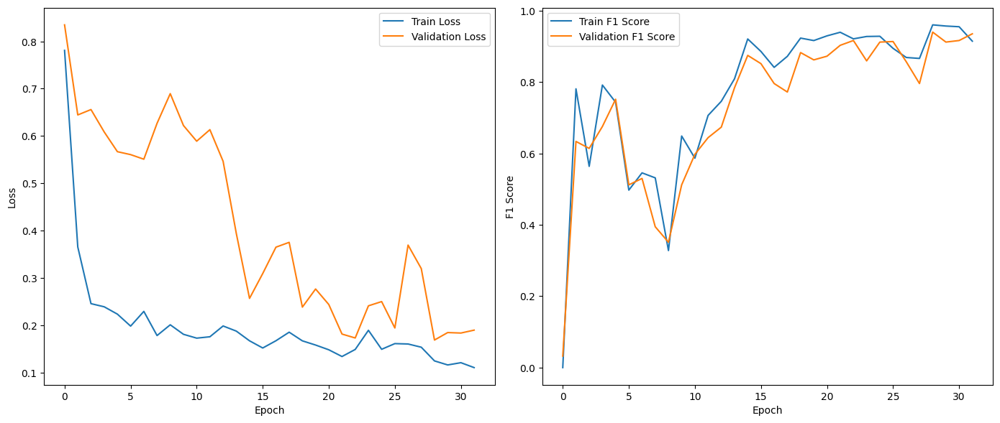

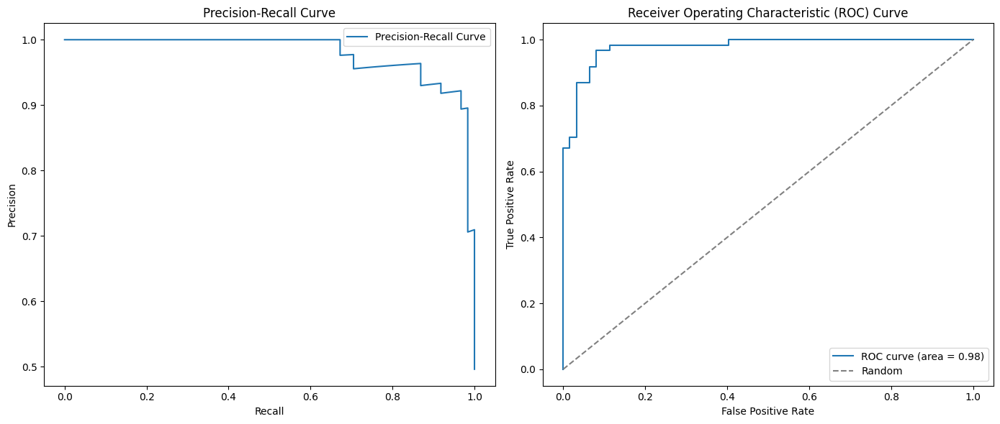

In [28]:
# Evaluate the model on the validation set
y_val_pred = model.predict(X_val)
fpr, tpr, _ = roc_curve(y_val, y_val_pred)
precision, recall, _ = precision_recall_curve(y_val, y_val_pred)

# Plotting
plt.figure(figsize=(14, 6))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(f1_callback.train_f1_scores, label='Train F1 Score')
plt.plot(f1_callback.val_f1_scores, label='Validation F1 Score')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.legend()

plt.tight_layout()
plt.show()

# Figure for precision-recall and ROC curves
plt.figure(figsize=(14, 6))

# Plot precision-recall curve
plt.subplot(1, 2, 1)
plt.plot(recall, precision, label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()

# Plot ROC curve
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, label='ROC curve (area = {:.2f})'.format(auc(fpr, tpr)))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()

plt.tight_layout()
plt.show()

In [29]:
model.evaluate(X_train, y_train)

27/27 [==============================] - 1s 38ms/step - loss: 0.2237 - accuracy: 0.9097 - precision: 0.8586 - recall: 0.9790 - auc: 0.9869


[0.22370727360248566,
 0.9097222089767456,
 0.8586065769195557,
 0.9789719581604004,
 0.986943244934082]

In [30]:
model.evaluate(X_val, y_val)

4/4 [==============================] - 0s 35ms/step - loss: 0.1896 - accuracy: 0.9350 - precision: 0.9206 - recall: 0.9508 - auc: 0.9786


[0.18959705531597137,
 0.934959352016449,
 0.920634925365448,
 0.9508196711540222,
 0.9785827994346619]

In [31]:
model.evaluate(X_test, y_test)

2/2 [==============================] - 0s 148ms/step - loss: 0.0825 - accuracy: 0.9841 - precision: 1.0000 - recall: 0.9706 - auc: 0.9990


[0.08249954879283905,
 0.9841269850730896,
 1.0,
 0.970588207244873,
 0.9989858269691467]

### Hyperparameter Tuning for Binary 1 (No_advisory & Caution/Danger)

In [22]:
# import tensorflow as tf
# from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Add, Input, GlobalAveragePooling2D, Dense
# from tensorflow.keras.models import Model
# from tensorflow.keras import optimizers
# from kerastuner import Hyperband

# # Define your training and validation data (X_train, y_train, X_val, y_val)

# def residual_block(x, filters, kernel_size=3, stride=1):
#     shortcut = x
#     y = Conv2D(filters, kernel_size=kernel_size, strides=stride, padding='same')(x)
#     y = BatchNormalization()(y)
#     y = LeakyReLU(alpha=0.01)(y)
#     y = Conv2D(filters, kernel_size=kernel_size, padding='same')(y)
#     y = BatchNormalization()(y)
#     y = LeakyReLU(alpha=0.01)(y)

#     # Adjust the shortcut path to have the same shape as the main path
#     if x.shape[-1] != filters:
#         shortcut = Conv2D(filters, kernel_size=1, strides=stride, padding='same')(x)
    
#     out = Add()([shortcut, y])
#     out = LeakyReLU(alpha=0.01)(out)
#     return out


# def build_resnet(hp, input_shape, num_classes=1):
#     input_tensor = Input(shape=input_shape)
    
#     x = Conv2D(64, kernel_size=7, strides=2, padding='same')(input_tensor)
#     x = BatchNormalization()(x)
#     x = LeakyReLU(alpha=0.01)(x)
#     x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)
    
#     # Tune the number of residual blocks
#     for _ in range(hp.Int('num_blocks', min_value=2, max_value=32, step=10)):
#         x = residual_block(x, filters=hp.Choice('filters', values=[64, 128]))
    
#     x = GlobalAveragePooling2D()(x)
#     output_tensor = Dense(num_classes, activation='sigmoid')(x)
    
#     model = Model(inputs=input_tensor, outputs=output_tensor)
    
#     # Tune the learning rate
#     hp_learning_rate = hp.Choice('learning_rate', values=[1e-3, 1e-4])
#     model.compile(optimizer=optimizers.Adam(learning_rate=hp_learning_rate),
#                   loss='binary_crossentropy',
#                   metrics=['accuracy'])
    
#     return model
# # with tf.device("/cpu:0"):
# # Instantiate the tuner
# tuner = Hyperband(
#     lambda hp: build_resnet(hp, input_shape=(224, 224, 3)),
#     objective='val_accuracy',
#     max_epochs=32,
#     factor=3,
#     directory='my_dir', # Specify a directory to store the tuning results
#     project_name='resnet_tuning'
# )

# # Search for the best hyperparameter configuration
# tuner.search(X_train, y_train, epochs=32, validation_data=(X_val, y_val))

# # Access the best hyperparameters
# best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values
# print("Best Hyperparameters:", best_hyperparameters)

# # Get the best model
# best_model = tuner.get_best_models(num_models=1)[0]

Trial 15 Complete [00h 00m 18s]
val_accuracy: 0.5934959053993225

Best val_accuracy So Far: 0.869918704032898
Total elapsed time: 00h 04m 16s
Best Hyperparameters: {'num_blocks': 2, 'filters': 64, 'learning_rate': 0.0001, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 3, 'tuner/round': 0}


In [23]:
# best_model.evaluate(X_train, y_train)

27/27 [==============================] - 1s 12ms/step - loss: 0.6394 - accuracy: 0.8507


[0.6394213438034058, 0.8506944179534912]

In [24]:
# best_model.evaluate(X_test, y_test)

2/2 [==============================] - 0s 123ms/step - loss: 0.6296 - accuracy: 0.9206


[0.6296068429946899, 0.920634925365448]

### Model Interpretability

Shape of image: (1, 224, 224, 3)


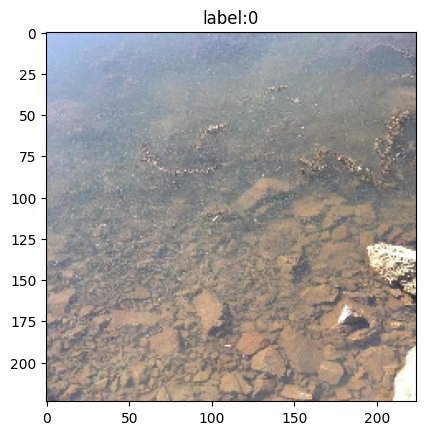

In [98]:
#Selecting one image for demonstration
img_idx= 32

#batches images, i.e. image[0,...,...]
img_tensor = np.expand_dims(X_val[img_idx], axis = 0);

# Print image tensor shape
print('Shape of image:', img_tensor.shape);

plt.imshow(img_tensor[0]);
plt.title('label:' + str(y_val[img_idx]))
plt.show()

#### Shap Values

In [99]:
# define the explainer
explainer = shap.GradientExplainer(model, X_train.numpy())

# we explain the model's predictions on the validation image at index==img_idx
shap_values = explainer.shap_values(X_val[img_idx:img_idx+1])

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


4/4 [==============================] - 0s 37ms/step


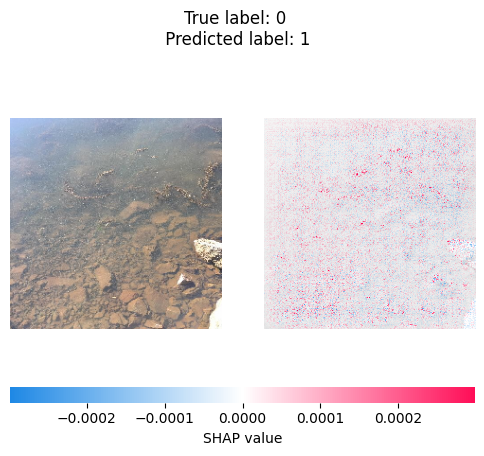

In [101]:
# plot the explanations for all classes 
shap.image_plot(
    [shap_values[i][0] for i in range(1)],
    np.squeeze(X_val[img_idx]),
    show=False
)

# compute predicted label for X_val[img_idx]
prob = model.predict(X_val)[img_idx]
# define a threshold for classification
threshold = 0.5

# compute predicted label based on the threshold
y_val_pred_img_idx = 1 if prob > threshold else 0

# add title
plt.suptitle(
    'True label: ' + str(y_val[img_idx]) +
    '\n Predicted label: ' + str(y_val_pred_img_idx));

## Saving / Loading Models

### Non-Hypertuned Model

In [32]:
#model.save('./../../../models/Binary_ResNet1')

INFO:tensorflow:Assets written to: ./../../../models/Binary_ResNet1/assets


INFO:tensorflow:Assets written to: ./../../../models/Binary_ResNet1/assets


In [33]:
# model = tf.keras.models.load_model('./../../../models/Binary_ResNet1')
# model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 112, 112, 64)         9472      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 112, 112, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 leaky_re_lu (LeakyReLU)     (None, 112, 112, 64)         0         ['batch_normalization[0][0

In [34]:
# val_results = model.evaluate(X_val, y_val)
# print('\nTest Acc. {:.2f}%'.format(val_results[1]*100))

4/4 [==============================] - 1s 45ms/step - loss: 0.1896 - accuracy: 0.9350 - precision: 0.9206 - recall: 0.9508 - auc: 0.9786

Test Acc. 93.50%


# Binary 2 (caution & danger)

In [27]:
# append cayuga and clear_lake df
df = pd.concat([df_caution, df_danger], ignore_index = True)
train_df = df.copy()

In [28]:
# Define a dictionary with the mappings
label_mapping = {
    'caution': 0,
    'danger': 1
}

# Create the 'encoded_labels' column
train_df['encoded_labels'] = train_df['label'].map(label_mapping)
#test_df['encoded_labels'] = test_df['label'].map(label_mapping)

In [29]:
print(train_df.label.value_counts())

label
danger     160
caution    149
Name: count, dtype: int64


In [30]:
train_df

,image_path,label,encoded_labels
0,./caution/105_image1-20200623-151103.jpg,caution,0
1,./caution/photo-20220907-213043__1663348521476...,caution,0
2,./caution/BloomImg1-20230925-140334.jpg,caution,0
3,./caution/155_image5-20200729-121538.jpg,caution,0
4,./caution/BloomImg1-20230802-142626(3).jpg,caution,0
...,...,...,...
304,./danger/156_image6-20200729-173935.jpg,danger,1
305,./danger/5AJ9UNGonW-Sz0Co3iL1yUGt3FIgu4phfOdns...,danger,1
306,./danger/5A0AE8~1.PNG,danger,1
307,./danger/5AE99D~1.PNG,danger,1


In [31]:
from sklearn.utils import resample

# Separate the majority and minority classes
majority_class = train_df[train_df['encoded_labels'] == 1]
minority_class = train_df[train_df['encoded_labels'] == 0]

# Upsample the minority class
minority_upsampled = resample(minority_class,
                              replace=True,  # Sample with replacement
                              n_samples=len(majority_class),  # Match the number in the majority class
                              random_state=42)  # Set a random seed for reproducibility

# Concatenate the majority class and upsampled minority class
upsampled_train_df = pd.concat([majority_class, minority_upsampled])

# Shuffle the DataFrame to mix the classes
upsampled_train_df = upsampled_train_df.sample(frac=1, random_state=42).reset_index(drop=True)

In [32]:
upsampled_train_df['encoded_labels'].value_counts()

encoded_labels
0    160
1    160
Name: count, dtype: int64

In [33]:
#X_test, y_test = preprocess1(test_df)
images_mini, y_mini = preprocess1(upsampled_train_df)
print(f"images_mini shape {images_mini.shape}")
print(f"y_mini shape {y_mini.shape}")

images_mini shape (320, 224, 224, 3)
y_mini shape (320,)


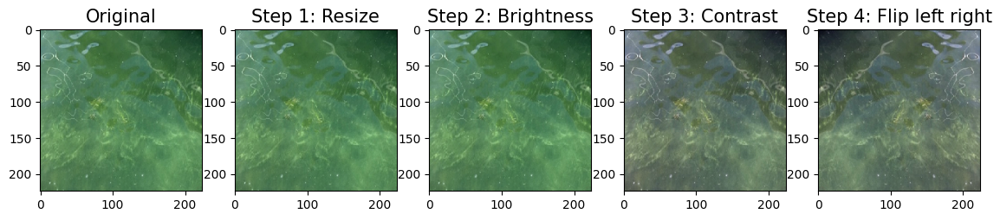

In [34]:
tf.random.set_seed(1234)

fig = plt.figure(figsize=(14, 12))

# pull first image from data
image = images_mini[0]

# plot original
ax = fig.add_subplot(1, 5, 1)
ax.imshow(array_to_img(image))
ax.set_title('Original', size=15);

# resize
ax = fig.add_subplot(1, 5, 2)
img_resize = tf.image.resize(image, size=(224, 224))
ax.imshow(array_to_img(img_resize))
ax.set_title('Step 1: Resize', size=15);


# adjust brightness
ax = fig.add_subplot(1, 5, 3)
img_bright = tf.image.adjust_brightness(img_resize, 0.3)
ax.imshow(array_to_img(img_bright))
ax.set_title('Step 2: Brightness', size=15);


# adjust contrast
ax = fig.add_subplot(1, 5, 4)
img_contrast = tf.image.adjust_contrast(img_bright, contrast_factor=3)
ax.imshow(array_to_img(img_contrast))
ax.set_title('Step 3: Contrast', size=15);


# flip left right
ax = fig.add_subplot(1, 5, 5)
img_flip = tf.image.flip_left_right(img_contrast)
ax.imshow(array_to_img(img_flip))
ax.set_title('Step 4: Flip left right', size=15);

In [35]:
X_train, y_train, X_val, y_val, X_test, y_test = preprocess2(
    images_mini,
    y_mini,
    split=(0.6, 0.3, 0.1)
)

In [36]:
#We have 5104 observations, each having 200x200 pixels, with each pixel having 3 values (which are all the same because they've been greyscaled)
print(f"X_train shape {X_train.shape}")
print(f"y_train shape {y_train.shape}")
print(f"X_val shape {X_val.shape}")
print(f"y_val shape {y_val.shape}")
print(f"X_test shape {X_test.shape}")
print(f"y_test shape {y_test.shape}")

X_train shape (384, 224, 224, 3)
y_train shape (384,)
X_val shape (96, 224, 224, 3)
y_val shape (96,)
X_test shape (32, 224, 224, 3)
y_test shape (32,)


Print training data examples:


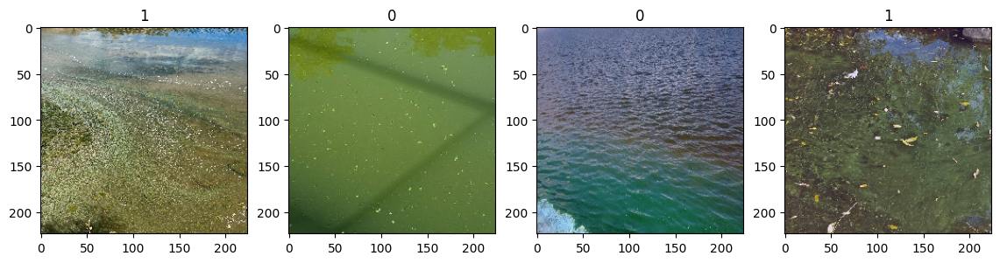

In [45]:
# print taining data
print('Print training data examples:')
nrows, ncols = 1,4 #print first 4 images
f, axs = plt.subplots(nrows, ncols, figsize=(14,12))
for i in range(ncols):
    axs[i].imshow(array_to_img(X_train[i]))
    axs[i].set(title=y_train[i])

Print validation data examples:


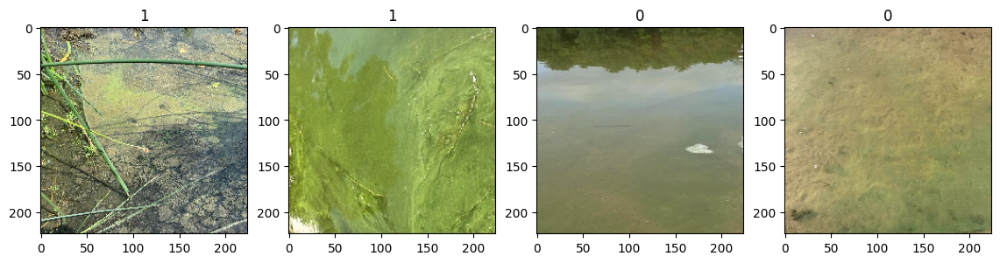

In [46]:
print('Print validation data examples:')
nrows, ncols = 1,4 #print first 4 images
f, axs = plt.subplots(nrows, ncols, figsize=(14,12))
for i in range(ncols):
    axs[i].imshow(array_to_img(X_val[i]))
    axs[i].set(title=y_val[i])

In [43]:
def residual_block(x, filters, kernel_size=3, stride=1):
    y = Conv2D(filters, kernel_size=kernel_size, strides=stride, padding='same')(x)
    y = BatchNormalization()(y)
    y = LeakyReLU(alpha=0.001)(y)
    y = Conv2D(filters, kernel_size=kernel_size, padding='same')(y)
    y = BatchNormalization()(y)
    y = LeakyReLU(alpha=0.001)(y)
    if stride > 1:
        x = Conv2D(filters, kernel_size=1, strides=stride, padding='same')(x)
    out = Add()([x, y]) 
    out = LeakyReLU(alpha=0.001)(out)
    return out

def build_resnet(input_shape, num_blocks, num_classes=1):
    input_tensor = Input(shape=input_shape)
    
    x = Conv2D(64, kernel_size=7, strides=2, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.001)(x)
    x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)
    
    for _ in range(num_blocks):
        x = residual_block(x, filters=64)
    
    x = GlobalAveragePooling2D()(x)
    output_tensor = Dense(num_classes, activation='sigmoid')(x)
    
    model = Model(inputs=input_tensor, outputs=output_tensor)
    
    return model

# Create the ResNet model
input_shape = (224, 224, 3)
num_blocks = 16
model = build_resnet(input_shape, num_blocks)

# Compile the model with metrics
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy',
                       tf.keras.metrics.Precision(),
                       tf.keras.metrics.Recall(),
                       tf.keras.metrics.AUC(name='auc')])

# Create the F1 Score callback
f1_callback = F1ScoreCallback(train_data=(X_train, y_train), val_data=(X_val, y_val))

# Train the model for more epochs
history = model.fit(X_train, y_train, epochs=60, validation_data=(X_val, y_val), callbacks=[f1_callback])

Epoch 1/60
3/3 [==============================] - 0s 36ms/step
 - train_f1: 0.0000 - val_f1: 0.0000
12/12 [==============================] - 12s 294ms/step - loss: 3.9905 - accuracy: 0.4974 - precision_3: 0.4286 - recall_3: 0.0156 - auc: 0.5282 - val_loss: 0.7512 - val_accuracy: 0.4688 - val_precision_3: 0.0000e+00 - val_recall_3: 0.0000e+00 - val_auc: 0.6630
Epoch 2/60
3/3 [==============================] - 0s 36ms/step
 - train_f1: 0.0000 - val_f1: 0.0000
12/12 [==============================] - 2s 196ms/step - loss: 1.9580 - accuracy: 0.5365 - precision_3: 0.7059 - recall_3: 0.1250 - auc: 0.5861 - val_loss: 0.7211 - val_accuracy: 0.4688 - val_precision_3: 0.0000e+00 - val_recall_3: 0.0000e+00 - val_auc: 0.6784
Epoch 3/60
3/3 [==============================] - 0s 41ms/step
 - train_f1: 0.0103 - val_f1: 0.0000
12/12 [==============================] - 2s 200ms/step - loss: 1.0443 - accuracy: 0.5417 - precision_3: 0.5870 - recall_3: 0.2812 - auc: 0.5906 - val_loss: 0.7219 - val_accuracy

3/3 [==============================] - 0s 78ms/step


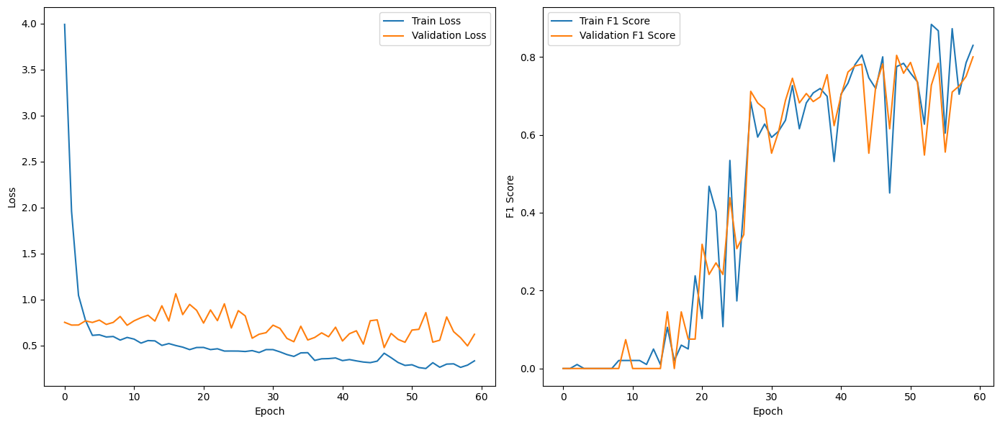

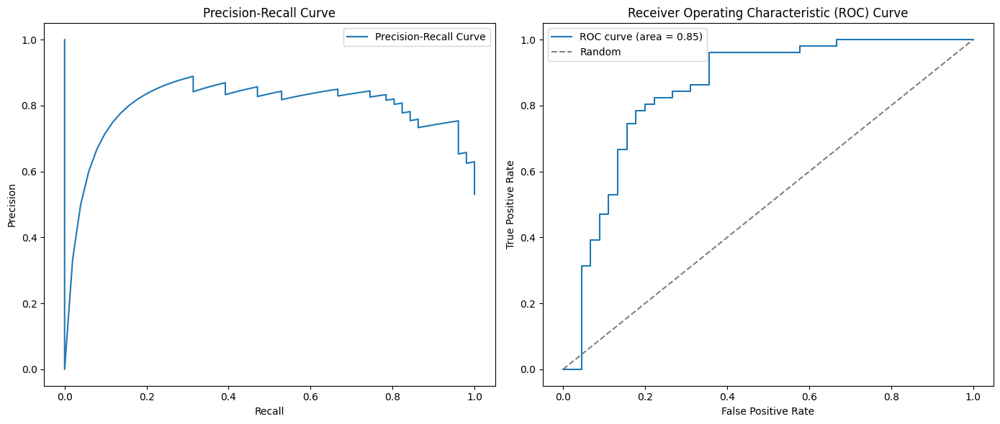

In [44]:
# Evaluate the model on the validation set
y_val_pred = model.predict(X_val)
fpr, tpr, _ = roc_curve(y_val, y_val_pred)
precision, recall, _ = precision_recall_curve(y_val, y_val_pred)

# Plotting
plt.figure(figsize=(14, 6))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(f1_callback.train_f1_scores, label='Train F1 Score')
plt.plot(f1_callback.val_f1_scores, label='Validation F1 Score')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.legend()

plt.tight_layout()
plt.show()

# Figure for precision-recall and ROC curves
plt.figure(figsize=(14, 6))

# Plot precision-recall curve
plt.subplot(1, 2, 1)
plt.plot(recall, precision, label='Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()

# Plot ROC curve
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, label='ROC curve (area = {:.2f})'.format(auc(fpr, tpr)))
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()

plt.tight_layout()
plt.show()

### Hyperparameter Tuning for Binary 2 (Caution & Danger)

In [49]:
# import tensorflow as tf
# from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Add, Input, GlobalAveragePooling2D, Dense
# from tensorflow.keras.models import Model
# from tensorflow.keras import optimizers
# from kerastuner import Hyperband

# # Define your training and validation data (X_train, y_train, X_val, y_val)

# def residual_block(x, filters, kernel_size=3, stride=1):
#     shortcut = x
#     y = Conv2D(filters, kernel_size=kernel_size, strides=stride, padding='same')(x)
#     y = BatchNormalization()(y)
#     y = LeakyReLU(alpha=0.01)(y)
#     y = Conv2D(filters, kernel_size=kernel_size, padding='same')(y)
#     y = BatchNormalization()(y)
#     y = LeakyReLU(alpha=0.01)(y)

#     # Adjust the shortcut path to have the same shape as the main path
#     if x.shape[-1] != filters:
#         shortcut = Conv2D(filters, kernel_size=1, strides=stride, padding='same')(x)
    
#     out = Add()([shortcut, y])
#     out = LeakyReLU(alpha=0.01)(out)
#     return out


# def build_resnet(hp, input_shape, num_classes=1):
#     input_tensor = Input(shape=input_shape)
    
#     x = Conv2D(64, kernel_size=7, strides=2, padding='same')(input_tensor)
#     x = BatchNormalization()(x)
#     x = LeakyReLU(alpha=0.01)(x)
#     x = tf.keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(x)
    
#     # Tune the number of residual blocks
#     for _ in range(hp.Int('num_blocks', min_value=2, max_value=32, step=10)):
#         x = residual_block(x, filters=hp.Choice('filters', values=[64, 128]))
    
#     x = GlobalAveragePooling2D()(x)
#     output_tensor = Dense(num_classes, activation='sigmoid')(x)
    
#     model = Model(inputs=input_tensor, outputs=output_tensor)
    
#     # Tune the learning rate
#     hp_learning_rate = hp.Choice('learning_rate', values=[1e-3, 1e-4])
#     model.compile(optimizer=optimizers.Adam(learning_rate=hp_learning_rate),
#                   loss='binary_crossentropy',
#                   metrics=['accuracy'])
    
#     return model
# # with tf.device("/cpu:0"):
# # Instantiate the tuner
# tuner = Hyperband(
#     lambda hp: build_resnet(hp, input_shape=(224, 224, 3)),
#     objective='val_accuracy',
#     max_epochs=32,
#     factor=3,
#     directory='my_dir', # Specify a directory to store the tuning results
#     project_name='intro_to_kt2'
# )

# # Search for the best hyperparameter configuration
# tuner.search(X_train, y_train, epochs=32, validation_data=(X_val, y_val))

# # Access the best hyperparameters
# best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values
# print("Best Hyperparameters:", best_hyperparameters)

# # Get the best model
# best_model = tuner.get_best_models(num_models=1)[0]

`import kerastuner` is deprecated, please use `import keras_tuner`.


Reloading Tuner from my_dir/intro_to_kt2/tuner0.json
Best Hyperparameters: {'num_blocks': 2, 'filters': 128, 'learning_rate': 0.001, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 3, 'tuner/round': 0}


In [34]:
# import tensorflow as tf
# from tensorflow import keras
# from kerastuner.tuners import Hyperband
# from keras_tuner import Objective


# def model_builder(hp):
#     model = keras.Sequential()
#     model.add(keras.layers.Flatten(input_shape=(224, 224, 3)))

#     # Tune the number of units in the first Dense layer
#     # Choose an optimal value between 32-512
#     hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
#     model.add(keras.layers.Dense(units=hp_units, activation='relu'))
#     model.add(keras.layers.Dense(10))

#     # Tune the learning rate for the optimizer
#     # Choose an optimal value from 0.01, 0.001, or 0.0001
#     hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

#     model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
#                   loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
#                   metrics=['accuracy'])

#     return model


# with tf.device('/CPU:0'):
# # Instantiate the tuner
#     tuner = Hyperband(model_builder,
#                     objective='val_accuracy',
#                     max_epochs=30,
#                     factor=3,
#                     directory='my_dir',
#                         project_name='intro_to_kt2') 

#     # Search for the best hyperparameter configuration
#     tuner.search(X_train, y_train, epochs=30, validation_data=(X_val, y_val))

#     # Access the best hyperparameters
#     best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values
#     print("Best Hyperparameters:", best_hyperparameters)

#     # Get the best model
#     best_model = tuner.get_best_models(num_models=1)[0]

Trial 53 Complete [00h 00m 02s]
val_accuracy: 0.71875

Best val_accuracy So Far: 0.75
Total elapsed time: 00h 11m 05s
Best Hyperparameters: {'units': 160, 'learning_rate': 0.001, 'tuner/epochs': 4, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}


In [36]:
# eval_metrics = best_model.evaluate(X_test, y_test)

# # Print the evaluation metrics
# print("Evaluation Metrics:")
# print(f"Loss: {eval_metrics[0]}")
# print(f"Accuracy: {eval_metrics[1]}")

1/1 [==============================] - 0s 415ms/step - loss: 0.6680 - accuracy: 0.6562
Evaluation Metrics:
Loss: 0.6680222749710083
Accuracy: 0.65625


In [37]:
# # Predict probabilities on the validation set
# y_prob = best_model.predict(X_val)

# # Convert probabilities to predicted labels
# y_pred = tf.argmax(y_prob, axis=1)

# # True labels
# y_true = y_val

# # Calculate precision and recall
# precision, recall, _ = precision_recall_curve(y_true, y_prob[:, 1])

# # Calculate ROC curve and AUC
# fpr, tpr, thresholds = roc_curve(y_true, y_prob[:, 1])
# roc_auc = auc(fpr, tpr)

# # Plot precision-recall curve
# plt.figure(figsize=(12, 4))
# plt.subplot(1, 3, 1)
# plt.plot(recall, precision, color='darkorange', lw=2, label='Precision-Recall Curve')
# plt.xlabel('Recall')
# plt.ylabel('Precision')
# plt.title('Precision-Recall Curve')
# plt.legend()

# # Plot ROC curve
# plt.subplot(1, 3, 2)
# plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC Curve (AUC = {:.2f})'.format(roc_auc))
# plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.legend()

# # Plot accuracy over epochs
# history = best_model.fit(X_val, y_val, epochs=30, validation_data=(X_val, y_val), verbose=0)
# plt.subplot(1, 3, 3)
# plt.plot(history.history['accuracy'], label='Training Accuracy')
# plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
# plt.xlabel('Epoch')
# plt.ylabel('Accuracy')
# plt.title('Accuracy Over Epochs')
# plt.legend()

# plt.tight_layout()
# plt.show()


3/3 [==============================] - 0s 135ms/step


IndexError: index 1 is out of bounds for axis 1 with size 1

In [37]:
# # Define AUC as the objective
# auc_obj = Objective("val_auc", direction="max")

# def model_builder(hp):
#     model = keras.Sequential()
#     model.add(keras.layers.Flatten(input_shape=(224, 224, 3)))

#     # Tune the number of units in the first Dense layer
#     # Choose an optimal value between 32-512
#     hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
#     model.add(keras.layers.Dense(units=hp_units, activation='relu'))
    
#     # Output layer for binary classification
#     model.add(keras.layers.Dense(1, activation='sigmoid'))

#     # Tune the learning rate for the optimizer
#     # Choose an optimal value from 0.01, 0.001, or 0.0001
#     hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

#     model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
#                   loss='binary_crossentropy',  # Use binary_crossentropy for binary classification
#                   metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

#     return model

# # Instantiate the tuner
# tuner = Hyperband(model_builder,
#                   objective=auc_obj,
#                   max_epochs=30,
#                   factor=3,
#                   directory='my_dir',
#                   project_name='intro_to_kt3') 

# # Search for the best hyperparameter configuration
# tuner.search(X_train, y_train, epochs=30, validation_data=(X_val, y_val))

# # Access the best hyperparameters
# best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values
# print("Best Hyperparameters:", best_hyperparameters)

# # Get the best model
# best_model = tuner.get_best_models(num_models=1)[0]

Trial 4 Complete [00h 00m 11s]

Best val_auc So Far: 0.5098039507865906
Total elapsed time: 00h 00m 24s

Search: Running Trial #5

Value             |Best Value So Far |Hyperparameter
384               |64                |units
0.01              |0.001             |learning_rate
2                 |2                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
3                 |3                 |tuner/bracket
0                 |0                 |tuner/round



2023-12-04 14:17:40.634606: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 220.50MiB (rounded to 231211008)requested by op StatelessRandomUniformV2
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2023-12-04 14:17:40.634646: I tensorflow/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2023-12-04 14:17:40.634652: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 400, Chunks in use: 400. 100.0KiB allocated for chunks. 100.0KiB in use in bin. 27.3KiB client-requested in use in bin.
2023-12-04 14:17:40.634655: I tensorflow/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 10, Chunks in use: 10. 6.2KiB allocated for chunks. 6.2KiB in use in bin. 5.6KiB client-requested in use in bin.
2023-12-04 14:17:40.634657: I tens

RuntimeError: Number of consecutive failures exceeded the limit of 3.
Traceback (most recent call last):
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/engine/base_tuner.py", line 273, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/engine/base_tuner.py", line 238, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/tuners/hyperband.py", line 427, in run_trial
    return super().run_trial(trial, *fit_args, **fit_kwargs)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/engine/tuner.py", line 314, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/engine/tuner.py", line 232, in _build_and_fit_model
    model = self._try_build(hp)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/engine/tuner.py", line 164, in _try_build
    model = self._build_hypermodel(hp)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/tuners/hyperband.py", line 430, in _build_hypermodel
    model = super()._build_hypermodel(hp)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras_tuner/src/engine/tuner.py", line 155, in _build_hypermodel
    model = self.hypermodel.build(hp)
  File "/tmp/ipykernel_502/1761435175.py", line 11, in model_builder
    model.add(keras.layers.Dense(units=hp_units, activation='relu'))
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/tensorflow/python/trackable/base.py", line 204, in _method_wrapper
    result = method(self, *args, **kwargs)
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/home/jpjon/miniconda3/envs/aqua/lib/python3.9/site-packages/keras/src/backend.py", line 2102, in random_uniform
    return tf.random.stateless_uniform(
tensorflow.python.framework.errors_impl.ResourceExhaustedError: {{function_node __wrapped__StatelessRandomUniformV2_device_/job:localhost/replica:0/task:0/device:GPU:0}} OOM when allocating tensor with shape[150528,384] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:StatelessRandomUniformV2] name: 


In [39]:
# print("Best Model Architecture:")
# best_model.summary()

Best Model Architecture:
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 112, 112, 64)         9472      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 112, 112, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 leaky_re_lu (LeakyReLU)     (None, 112, 112, 64)         0         [

In [38]:
# # Evaluate the best model on the validation set
# evaluation_metrics = best_model.evaluate(X_val, y_val)

# # Print evaluation metrics
# print("Evaluation Metrics:")
# print("Loss:", evaluation_metrics[0])
# print("Accuracy:", evaluation_metrics[1])
# print("AUC:", evaluation_metrics[2])  # Assuming AUC is the third metric in the list

3/3 [==============================] - 0s 16ms/step - loss: 0.6602 - accuracy: 0.6458
Evaluation Metrics:
Loss: 0.6602396965026855
Accuracy: 0.6458333134651184


IndexError: list index out of range

3/3 [==============================] - 0s 130ms/step


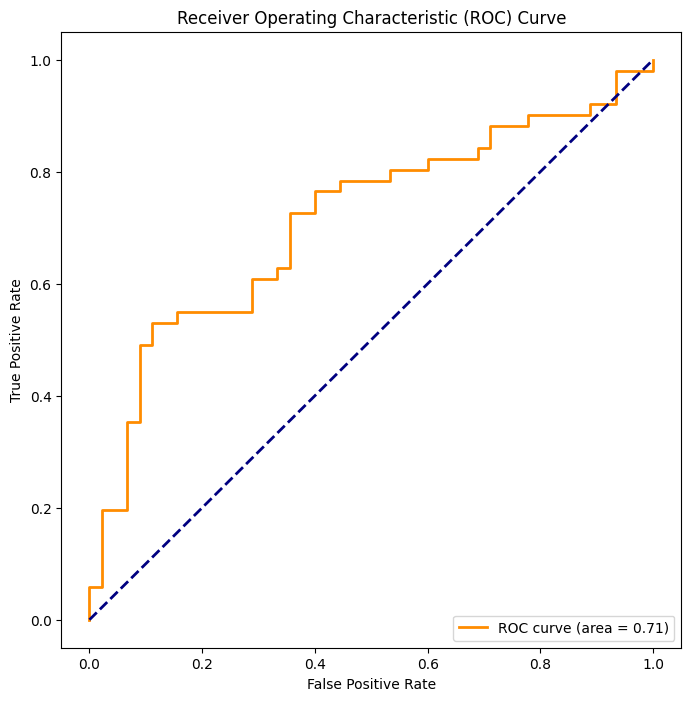

In [40]:
# # Get predictions from the best model
# y_pred_prob = best_model.predict(X_val)

# # Compute ROC curve and ROC area
# fpr, tpr, _ = roc_curve(y_val, y_pred_prob)
# roc_auc = auc(fpr, tpr)

# precision, recall, _ = precision_recall_curve(y_val, y_pred_prob)
# average_precision = average_precision_score(y_val, y_pred_prob)

# plt.figure(figsize=(8, 8))
# plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
# plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.legend(loc="lower right")
# plt.show()

### Model Interpretability

Shape of image: (1, 224, 224, 3)


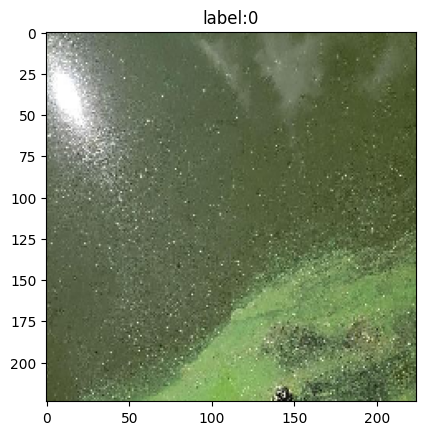

In [74]:
#Selecting one image for demonstration
img_idx= 22
img_tensor = np.expand_dims(X_val[img_idx], axis = 0);

# Print image tensor shape
print('Shape of image:', img_tensor.shape);

plt.imshow(img_tensor[0]);
plt.title('label:' + str(y_val[img_idx]))
plt.show()

#### Salient Mapping

In [75]:
#Turning image to float value
images = tf.Variable(img_tensor, dtype=float)

with tf.GradientTape() as tape:
    #pass images into model in evaluation mode
    pred = best_model(images, training=False)
    #get the sorted predicted class probabilities
    class_idxs_sorted = np.argsort(pred.numpy().flatten())[::-1]
    #select class w/ highest probability
    loss = pred[0][class_idxs_sorted[0]]

#identifies gradients
grads = tape.gradient(loss, images)

NameError: name 'best_model' is not defined

In [76]:
#makes sure negative and positive values are considered
dgrad_abs = tf.math.abs(grads)
#getting the max gradient
dgrad_max_ = np.max(dgrad_abs, axis=3)[0]

In [77]:
## normalize to range between 0 and 1
arr_min, arr_max  = np.min(dgrad_max_), np.max(dgrad_max_)
#1e-18 to prevent zerodivision error
grad_eval = (dgrad_max_ - arr_min) / (arr_max - arr_min + 1e-18)

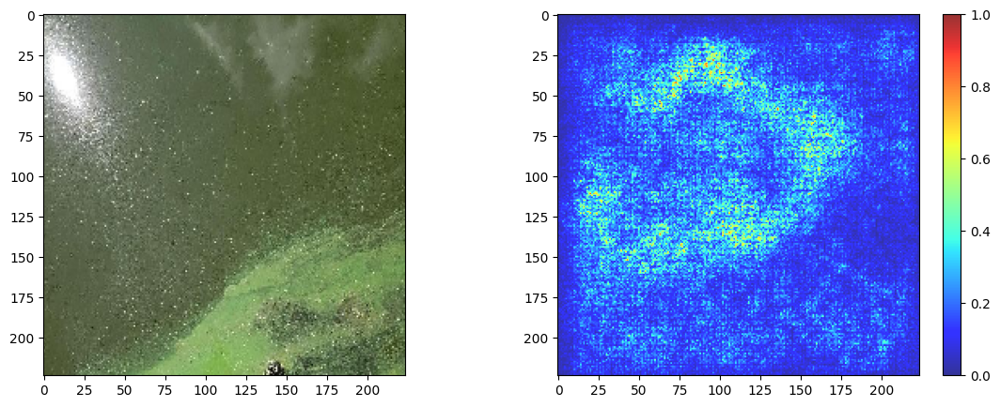

In [78]:
fig, axes = plt.subplots(1,2,figsize=(14,5))
axes[0].imshow(img_tensor[0])
i = axes[1].imshow(grad_eval,cmap="jet",alpha=0.8)
fig.colorbar(i)

#### Shap Values

In [79]:
# define the explainer
explainer = shap.GradientExplainer(best_model, X_train.numpy())

# we explain the model's predictions on the validation image at index==img_idx
shap_values = explainer.shap_values(X_val[img_idx:img_idx+1])

NameError: name 'best_model' is not defined

3/3 [==============================] - 0s 163ms/step


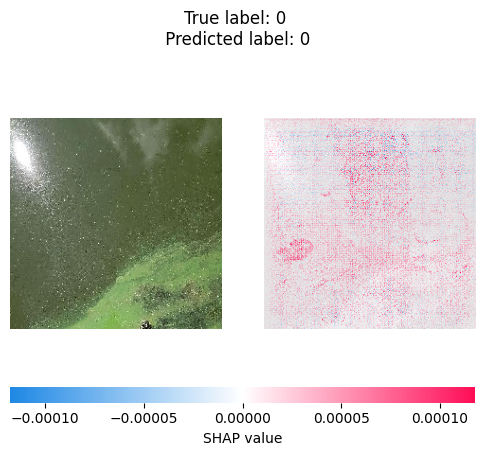

In [80]:
# plot the explanations for all classes 
shap.image_plot(
    [shap_values[i][0] for i in range(1)],
    np.squeeze(X_val[img_idx]),
    show=False
)

# compute predicted label for X_val[img_idx]
probs = model.predict(X_val)[img_idx]
y_val_pred_img_idx = np.argmax(probs)

# add title
plt.suptitle(
    'True label: ' + str(y_val[img_idx]) +
    '\n Predicted label: ' + str(y_val_pred_img_idx));

### Saving model

Make sure your cwd is in the correct directory

In [45]:
# model.save("../../../models/Binary_ResNet2")

INFO:tensorflow:Assets written to: ../../../models/Binary_ResNet2/assets


INFO:tensorflow:Assets written to: ../../../models/Binary_ResNet2/assets


In [51]:
# model = tf.keras.models.load_model("../../../models/Binary_ResNet2")
# model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_33 (Conv2D)          (None, 112, 112, 64)         9472      ['input_2[0][0]']             
                                                                                                  
 batch_normalization_33 (Ba  (None, 112, 112, 64)         256       ['conv2d_33[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 leaky_re_lu_49 (LeakyReLU)  (None, 112, 112, 64)         0         ['batch_normalization_33

In [46]:
# test_results = model.evaluate(X_val, y_val)
# print('\nTest Acc. {:.2f}%'.format(test_results[1]*100))

3/3 [==============================] - 0s 38ms/step - loss: 0.6210 - accuracy: 0.7812 - precision_3: 0.7778 - recall_3: 0.8235 - auc: 0.8558

Test Acc. 78.12%
